In [42]:
# imports
import math
import folium
import squarify
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.cm import viridis
from folium.plugins import HeatMap
from matplotlib.colors import Normalize
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [43]:
# read and display head of data
crime = pd.read_csv('./Boston-Crime.csv')
crime.head()

C:\Users\Sankar\AppData\Local\Temp\ipykernel_26524\200420756.py:2: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  crime = pd.read_csv('./Boston-Crime.csv')


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I152071100,2611,Other,ABDUCTION - INTICING,D4,151,NaN,2015-08-25 14:00:00,2015,8,Tuesday,14,Part Two,BERKELEY ST,42.346465,-71.070704,"(42.34646505, -71.07070436)"
1,I152054466,2611,Other,ABDUCTION - INTICING,B2,319,NaN,2015-07-01 20:30:00,2015,7,Wednesday,20,Part Two,NAZING ST,42.306641,-71.085850,"(42.30664081, -71.08584976)"
2,I162018570,2611,Other,ABDUCTION - INTICING,D4,,NaN,2016-03-09 17:28:00,2016,3,Wednesday,17,Part Two,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
3,I192018747,2611,Other,ABDUCTION - INTICING,B2,179,NaN,2019-03-13 19:34:00,2019,3,Wednesday,19,Part Two,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
4,I162001276,2611,Other,ABDUCTION - INTICING,B3,428,NaN,2016-01-05 16:12:00,2016,1,Tuesday,16,Part Two,NORFOLK ST,42.280566,-71.088017,"(42.28056608, -71.08801662)"


In [44]:
# display offense code descritption/group unique values
print('Amount of unique offense descriptions: ' + str(len(crime['OFFENSE_DESCRIPTION'].unique())))
print('Amount of unique offense code groups: ' + str(len(crime['OFFENSE_CODE_GROUP'].unique())))

Amount of unique offense descriptions: 283
Amount of unique offense code groups: 68


In [45]:
# displaying na value sums for each colum
crime.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP      98736
OFFENSE_DESCRIPTION         0
DISTRICT                 2462
REPORTING_AREA              0
SHOOTING               425093
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                98846
STREET                  21189
Lat                     29754
Long                    29754
Location                    0
dtype: int64

In [46]:
# dropped crime without known location
map_data = crime.dropna(subset=['Lat', 'Long'])

# displaying na value sums for each colum to make sure Long and Lat are dropped
map_data.isna().sum()


INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP      96186
OFFENSE_DESCRIPTION         0
DISTRICT                 1927
REPORTING_AREA              0
SHOOTING               397950
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                96295
STREET                  11111
Lat                         0
Long                        0
Location                    0
dtype: int64

In [47]:
# ncreating folium map of bosto
f = folium.Figure(width=700, height=400)
m = folium.Map(location=[42.32, -71.0589], titles='openstreetmap', zoom_start=10, max_zoom=15, min_zoom=10).add_to(f)

# ing addand displaying heat map of crimes with latitude/longitude 
HeatMap(data=map_data[['Lat', 'Long']], radius=10).add_to(m)
m

In [48]:
# looking at column data types
crime.dtypes


INCIDENT_NUMBER         object
OFFENSE_CODE             int64
OFFENSE_CODE_GROUP      object
OFFENSE_DESCRIPTION     object
DISTRICT                object
REPORTING_AREA          object
SHOOTING                object
OCCURRED_ON_DATE        object
YEAR                     int64
MONTH                    int64
DAY_OF_WEEK             object
HOUR                     int64
UCR_PART                object
STREET                  object
Lat                    float64
Long                   float64
Location                object
dtype: object

<Axes: >

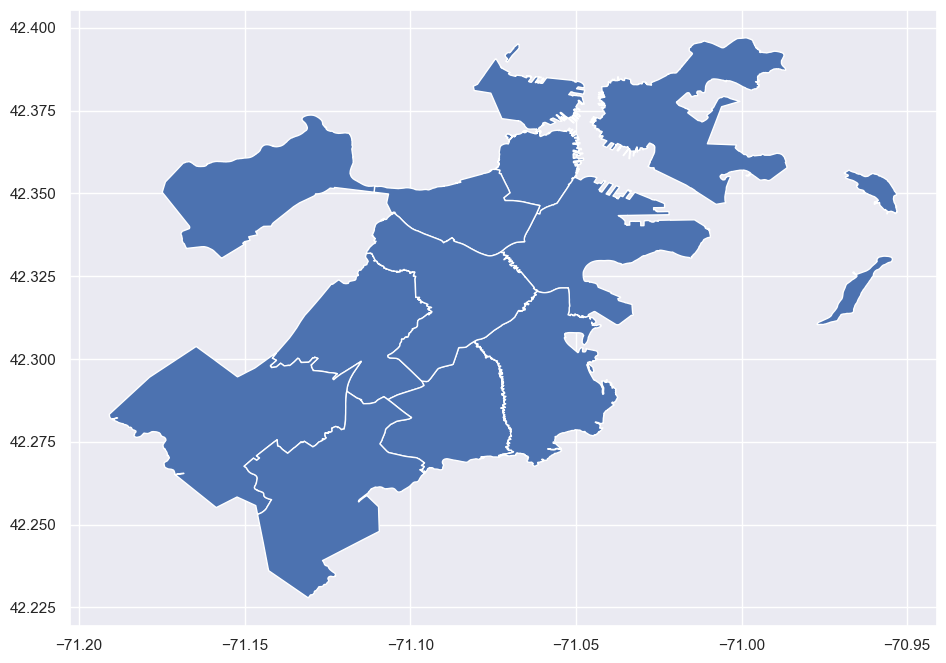

In [49]:
# reading and plotting boston police district shape data 
police_districts = gpd.read_file('./police_districts.shp')
police_districts.plot()

Text(0.5, 1.0, 'Crime Districts in Boston')

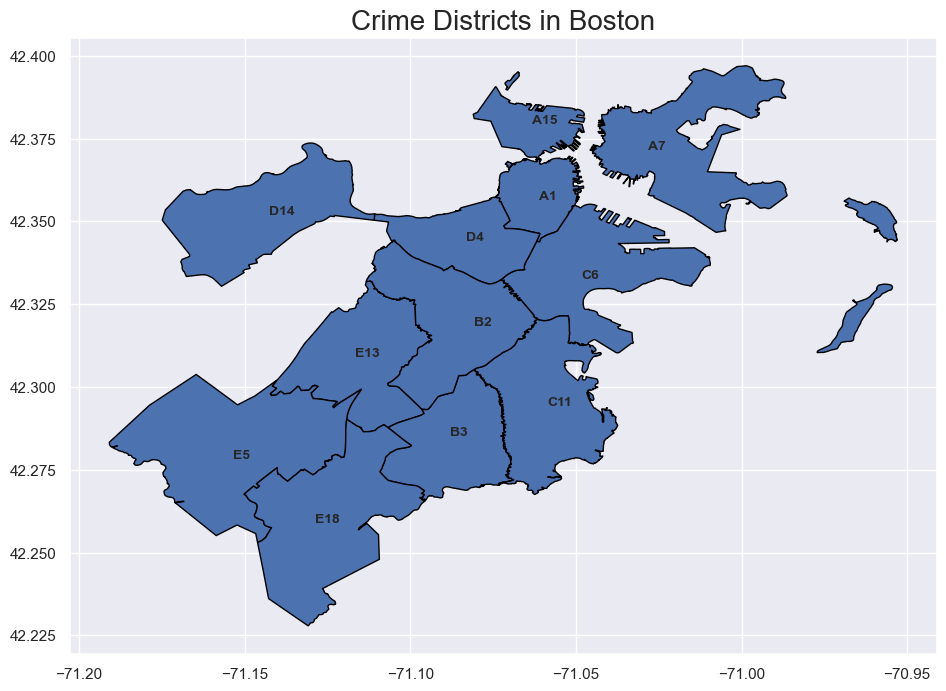

In [50]:
# label reference points on map
police_districts['point'] = police_districts.representative_point()
labels = police_districts.copy()
labels.set_geometry('point', inplace = True)

# plot districts
ax = police_districts.plot(figsize = (12,8), edgecolor = 'black')

# put labels in districts
for x, y, label in zip(labels.geometry.x, labels.geometry.y, labels['DISTRICT']):
    plt.text(x, y, label, fontsize = 10, fontweight = 'bold')


plt.title('Crime Districts in Boston', fontsize = 20)

In [51]:
# getting rid of external district values
crime_districts = crime[crime['DISTRICT'] != 'External']
crime_districts = crime_districts['DISTRICT'].value_counts()

Text(0.5, 1.0, 'Crimes per district in Boston')

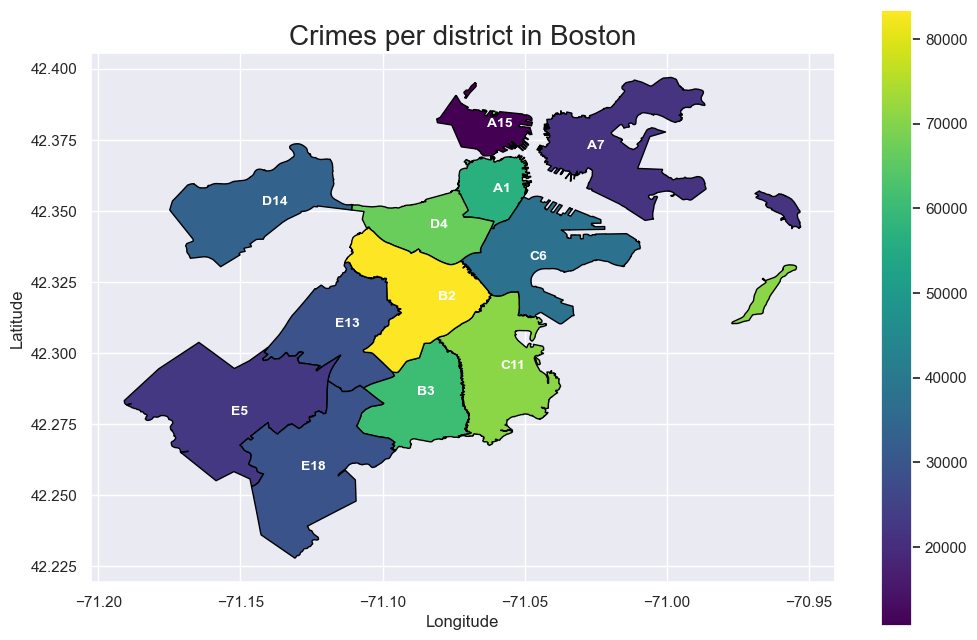

In [52]:
# mapping and plotting district crime data
police_districts['crimes'] = police_districts.DISTRICT.map(crime_districts)
ax = police_districts.plot(column = police_districts.crimes, cmap = 'viridis', legend = True, edgecolor = 'black', figsize = (12,8))

# put labels in districts
for x, y, label in zip(labels.geometry.x, labels.geometry.y, labels['DISTRICT']):
    plt.text(x, y, label, fontsize = 10, fontweight = 'bold', c = 'white')


plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Crimes per district in Boston', fontsize = 20)

In [53]:
# setting seaborn plot sizes
sns.set(rc={'figure.figsize':(12,8)})

# function for quicker heatmap creation
def heatmap_maker(data, index, columns, xlabel, ylabel, title):
    pivot = pd.pivot_table(data=data, index=index, columns=columns, values = 'INCIDENT_NUMBER', aggfunc = 'count')
    sns.heatmap(pivot, cmap = 'viridis')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title, fontsize = 20)

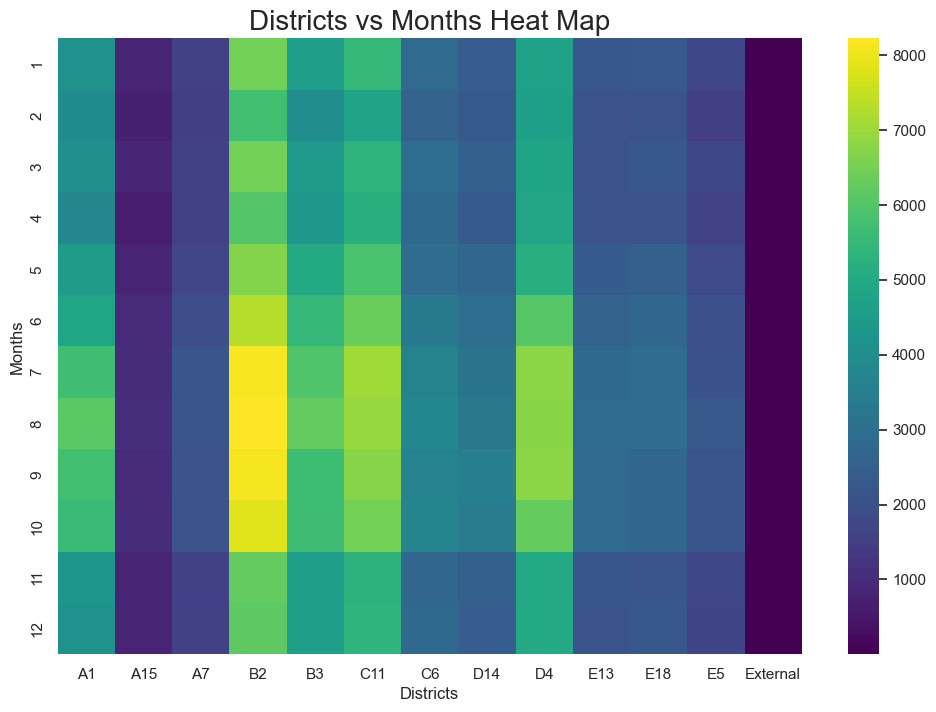

In [54]:
# heat map of districts vs months
heatmap_maker(data = crime, index = 'MONTH', columns = 'DISTRICT', 
                xlabel='Districts', ylabel='Months', title = 'Districts vs Months Heat Map')